In [6]:
import ROOT
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from scipy.special import erf
from scipy.signal import find_peaks
import random
import os
from scipy.stats import norm, chisquare
from sklearn.mixture import GaussianMixture

# Enable implicit multi-threading (optional)
ROOT.ROOT.EnableImplicitMT()

%matplotlib widget


In [7]:
file = ROOT.TFile.Open("./g4DL_output.root")
if not file or file.IsZombie():
    print("Error opening file.")


# Get the TTree
tree = file.Get("T")
df = ROOT.RDataFrame(tree)

In [8]:
num_table = np.array([
    1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
    4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
    5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6,
    6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6,
    6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7,
    7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7,
    7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7,
    7, 7, 7, 7, 7, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8,
    8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8,
    8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9,
    9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9,
    9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9,
    9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10,
    10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10,
    10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10,
    10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11,
    11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11,
    11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 12, 12, 12, 12, 12, 12, 12, 12,
    12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12,
    12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12,
    12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13,
    13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13,
    13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14,
    14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14,
    14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15,
    15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15,
    15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16,
    16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17,
    17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17,
    17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18,
    18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19,
    19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19,
    19, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20,
    20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21,
    21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22,
    22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23,
    23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24,
    24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25,
    25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27,
    27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28,
    28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30,
    30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32,
    32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34,
    34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 37, 37, 37, 37, 37, 37, 37, 37,
    37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40,
    40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44,
    44, 44, 44, 44, 44, 44, 44, 44, 44, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 47, 47, 47, 47, 47, 47, 47, 47, 47, 47, 47, 47, 47, 48, 48, 48, 48, 48, 48, 48, 48, 48, 48, 48, 48, 48, 48, 48, 48, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 51, 51, 51, 51, 51,
    51, 51, 51, 51, 51, 52, 52, 52, 52, 52, 52, 52, 52, 52, 52, 52, 52, 52, 53, 53, 53, 53, 53, 53, 53, 53, 53, 53, 53, 53, 53, 53, 54, 54, 54, 54, 54, 54, 54, 54, 54, 54, 55, 55, 55, 55, 55, 55, 55, 55, 55, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 57, 57, 57, 57, 57, 57, 57, 57, 57, 57, 58, 58, 58, 58, 58, 58, 58, 58, 59, 59, 59, 59, 59, 59, 59, 59, 59, 60, 60, 60, 60, 60, 60, 60, 60, 61, 61, 61,
    61, 61, 61, 61, 62, 62, 62, 62, 62, 62, 63, 63, 63, 63, 63, 64, 64, 64, 64, 64, 65, 65, 65, 65, 66, 66, 66, 66, 66, 66, 67, 67, 67, 67, 67, 68, 68, 68, 68, 68, 69, 69, 69, 69, 70, 70, 70, 70, 71, 71, 71, 72, 72, 72, 73, 73, 73, 74, 74, 74, 75, 75, 75, 75, 76, 76, 76, 77, 77, 78, 78, 79, 79, 79, 80, 80, 80, 81, 81, 81, 82, 82, 83, 83, 83, 84, 84, 85, 86, 86, 87, 87, 87, 88, 89, 89, 90, 91, 92, 92,
    93, 94, 94, 95, 96, 96, 97, 97, 98, 98, 99, 100, 101, 102, 103, 103, 104, 105, 107, 108, 108, 109, 110, 111, 111, 113, 113, 114, 115, 116, 117, 119, 119, 120, 121, 126, 128, 130, 131, 133, 133, 137, 138, 139, 140, 143, 144, 148, 150, 154, 156, 157, 160, 164, 166, 168, 169, 172, 176, 179, 183, 185, 187, 189, 191, 194, 195, 199, 205, 208, 214, 217, 226, 232, 236, 240, 246, 257, 261, 262, 282, 287, 298, 311, 316, 329, 345, 354, 372, 381, 397, 405, 425, 456, 479, 517, 533, 552, 846, 965
])

gain_table = np.array([
    1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
    2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3,
    3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
    3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
    4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
    5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
    5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6,
    6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 7, 7, 7, 7, 7, 7, 7,
    7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7,
    7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8,
    8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8,
    8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9,
    9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10,
    10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10,
    10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11,
    11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 12, 12, 12, 12, 12, 12,
    12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12,
    12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13,
    13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 14, 14, 14,
    14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14,
    14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15,
    15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16,
    16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16,
    16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17,
    17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18,
    18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19,
    19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19,
    20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20,
    20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21,
    21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22,
    22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23,
    23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24,
    24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25,
    25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26,
    26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27,
    27, 27, 27, 27, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29,
    29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 29, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30,
    30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31,
    31, 31, 31, 31, 31, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33,
    33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 35, 35, 35, 35, 35, 35,
    35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36, 36,
    36, 36, 36, 36, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 37, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38, 38,
    38, 38, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 40, 41, 41, 41, 41, 41, 41, 41, 41, 41,
    41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43,
    43, 43, 43, 43, 43, 43, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46, 46,
    46, 46, 46, 46, 47, 47, 47, 47, 47, 47, 47, 47, 47, 47, 47, 47, 47, 47, 47, 47, 47, 47, 47, 47, 47, 47, 47, 47, 47, 47, 47, 47, 47, 48, 48, 48, 48, 48, 48, 48, 48, 48, 48, 48, 48, 48, 48, 48, 48, 48, 48, 48, 48, 48, 48, 48, 48, 48, 48, 48, 48, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 49, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50,
    50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 51, 51, 51, 51, 51, 51, 51, 51, 51, 51, 51, 51, 51, 51, 51, 51, 51, 51, 51, 51, 51, 51, 51, 52, 52, 52, 52, 52, 52, 52, 52, 52, 52, 52, 52, 52, 52, 52, 52, 52, 52, 52, 52, 52, 52, 53, 53, 53, 53, 53, 53, 53, 53, 53, 53, 53, 53, 53, 53, 53, 53, 53, 53, 53, 53, 54, 54, 54, 54, 54, 54, 54, 54, 54, 54, 54, 54, 54, 54, 54, 54, 54, 54, 54, 54, 55, 55, 55, 55,
    55, 55, 55, 55, 55, 55, 55, 55, 55, 55, 55, 55, 55, 55, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 57, 57, 57, 57, 57, 57, 57, 57, 57, 57, 57, 57, 57, 57, 57, 57, 58, 58, 58, 58, 58, 58, 58, 58, 58, 58, 58, 58, 58, 58, 58, 59, 59, 59, 59, 59, 59, 59, 59, 59, 59, 59, 59, 59, 59, 59, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 60, 61, 61, 61, 61, 61, 61, 61, 61, 61, 61,
    61, 61, 61, 62, 62, 62, 62, 62, 62, 62, 62, 62, 62, 62, 62, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 64, 64, 64, 64, 64, 64, 64, 64, 64, 64, 65, 65, 65, 65, 65, 65, 65, 65, 65, 65, 66, 66, 66, 66, 66, 66, 66, 66, 66, 66, 67, 67, 67, 67, 67, 67, 67, 67, 67, 68, 68, 68, 68, 68, 68, 68, 68, 69, 69, 69, 69, 69, 69, 69, 69, 70, 70, 70, 70, 70, 70, 70, 71, 71, 71, 71, 71, 71, 71, 72, 72, 72, 72,
    72, 72, 72, 73, 73, 73, 73, 73, 73, 74, 74, 74, 74, 74, 74, 75, 75, 75, 75, 75, 76, 76, 76, 76, 76, 77, 77, 77, 77, 77, 78, 78, 78, 78, 78, 79, 79, 79, 79, 80, 80, 80, 80, 81, 81, 81, 81, 82, 82, 82, 83, 83, 83, 83, 84, 84, 84, 85, 85, 85, 86, 86, 87, 87, 87, 88, 88, 89, 89, 89, 90, 90, 91, 91, 92, 92, 93, 93, 94, 95, 95, 96, 97, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 109, 111, 112, 114, 117, 120
])



In [9]:
class event():
    def __init__(self, ID):
        self.ID = ID

        self.GEM0_distx = []
        self.GEM0_disty = []

        self.GEM1_distx = []
        self.GEM1_disty = []

        self.GEM2_distx = []
        self.GEM2_disty = []

        self.GEM3_distx = []
        self.GEM3_disty = []

        self.GEM0_hitsx = []
        self.GEM0_hitsy = []

        self.GEM1_hitsx = []
        self.GEM1_hitsy = []

        self.GEM2_hitsx = []
        self.GEM2_hitsy = []

        self.GEM3_hitsx = []
        self.GEM3_hitsy = []

        self.GEM0_qualx = []
        self.GEM0_qualy = []

        self.GEM1_qualx = []
        self.GEM1_qualy = []

        self.GEM2_qualx = []
        self.GEM2_qualy = []

        self.GEM3_qualx = []
        self.GEM3_qualy = []

        self.GEM0_clusx = []
        self.GEM0_clusy = []

        self.GEM1_clusx = []
        self.GEM1_clusy = []

        self.GEM2_clusx = []
        self.GEM2_clusy = []

        self.GEM3_clusx = []
        self.GEM3_clusy = []

        self.GEM0_ang = -1

        self.GEM1_ang = -1

        self.GEM2_ang = -1

        self.GEM3_ang = -1

        self.GEM0_true = []
        self.GEM1_true = []
        self.GEM2_true = []
        self.GEM3_true = []

        self.p_truex0 = []
        self.e_truex0 = []
        
        self.p_truev0 = []
        self.e_truev0 = []

        self.p_reconx0 = []
        self.p_reconv0 = []

        self.e_reconx0 = []
        self.e_reconv0 = []


In [10]:
xss = np.array(df.AsNumpy([f'GEM{0}_LocalHitX'])[f'GEM{0}_LocalHitX'])

events = [event(i) for i in range(len(xss))]

In [11]:
def find_true(xs, ys, zs):
    xs, ys, zs = map(np.asarray, (xs, ys, zs))
    if not (len(xs) == len(ys) == len(zs)):
        raise ValueError("xs, ys, and zs must have the same length")

    points = np.vstack((xs, ys, zs)).T
    centroid = np.mean(points, axis=0)
    centered = points - centroid

    # PCA via covariance matrix
    try:
        cov = np.cov(centered.T)
        eigenvalues, eigenvectors = np.linalg.eigh(cov)
        direction = eigenvectors[:, np.argmax(eigenvalues)]
    except Exception:
        print('Error in Finding Truth')
        return np.array([np.nan] * 3)

    if np.isclose(direction[2], 0):
        raise ValueError("Fitted line is parallel to the z=0 plane, no intersection.")

    t = -centroid[2] / direction[2]
    intersection = centroid + t * direction
    intersection[2] = 0  # enforce exact z=0

    return intersection

# Simulate All the Distributions

In [12]:
for GEMnum in range(4):

    xss = np.array(df.AsNumpy([f'GEM{GEMnum}_LocalHitX'])[f'GEM{GEMnum}_LocalHitX'])
    yss = np.array(df.AsNumpy([f'GEM{GEMnum}_LocalHitY'])[f'GEM{GEMnum}_LocalHitY'])
    zss = np.array(df.AsNumpy([f'GEM{GEMnum}_LocalHitZ'])[f'GEM{GEMnum}_LocalHitZ'])
    idss = np.array(df.AsNumpy([f'GEM{GEMnum}_TrackID'])[f'GEM{GEMnum}_TrackID'])

    print(GEMnum)

    for eventnum, (xs, ys, zs, ids) in enumerate(zip(xss, yss, zss, idss)):
        # print(eventnum)
        xs = np.array(xs)
        ys = np.array(ys)
        zs = np.array(zs)
        ids = np.array(ids)


        # Find the true intersection at middle of GEM
        mainxs = xs[(ids == 1) | (ids == 2)]
        mainys = ys[(ids == 1) | (ids == 2)]
        mainzs = zs[(ids == 1) | (ids == 2)]

        z0 = find_true(mainxs, mainys, mainzs)

        if GEMnum in [1,3]: z0[2] = 24.9

        exec(f"events[eventnum].GEM{GEMnum}_true = z0")
        
        hitsx = []
        hitsy = []

        n_chanx = 1024
        n_chany = 640

        distx = np.zeros(n_chanx)
        disty = np.zeros(n_chany)

        tracks = []
        track_cuts = [0, ]

        cum_l = [] 

        if len(ids) < 1: continue

        id = ids[0]
        for i in range(len(xs) - 1):
            dx = xs[i] - xs[i + 1]
            dy = ys[i] - ys[i + 1]
            dz = zs[i] - zs[i + 1]
            dl = (dx**2 + dy**2 + dz**2) ** 0.5

            if dl < 0.5:
                if len(cum_l) == 0: cum_l.append(dl) 
                else: cum_l.append( cum_l[-1] + dl )
            else:
                tracks.append(np.array(cum_l))
                cum_l = []
                track_cuts.append(i+1)
                id = ids[i]

        tracks.append(np.array(cum_l))

        for track, cut in zip(tracks, track_cuts):
            if len(track) < 1: continue
            length = track[-1]
            

            num_hits = round(num_table[random.randint(0, 4999)] * length/3.0) * 3

            for i in range(num_hits):
                if len(track) > 1:
                    t = random.uniform(0, length)
                    # print(t, length)
                    idx = np.sort(np.argwhere(t > track))[-1][0] if len(np.sort(np.argwhere(t > track))) > 0 else 0
                    t = (t - track[idx]) / (track[idx+1] - track[idx])

                    hitsx.append(xs[cut+idx] + t * (xs[cut+idx+1] - xs[cut+idx]))
                    hitsy.append(ys[cut+idx] + t * (ys[cut+idx+1] - ys[cut+idx]))

        hitsx = np.array(hitsx)
        hitsy = np.array(hitsy)

        gains = np.array([  gain_table[random.randint(0,4999)] *
                            gain_table[random.randint(0,4999)] *
                            gain_table[random.randint(0,4999)]  for i in hitsx])


        for i, hx in enumerate(hitsx):
            # Position in channels
            half_length = 199.8
            len_per_chan = 0.390625
            pos_chan = (-hx + half_length) / len_per_chan

            # Gain sampled from precomputed table
            g = gains[i]
            g /= 2400  # Normalization factor; equivalent to GEMapv scaling

            # Spread charge to nearby channels
            for off in range(-3, 4):
                chan = np.round(pos_chan + off)
                if chan < 0 or chan >= n_chanx:
                    continue

                # Compute integrated Gaussian between bin edges (CDF difference)
                cdf1 = 0.5 * (1 + erf((chan - 0.5 - pos_chan) / (np.sqrt(2) * 0.67)))
                cdf2 = 0.5 * (1 + erf((chan + 0.5 - pos_chan) / (np.sqrt(2) * 0.67)))
                distx[int(chan)] += g * 0.5 * (cdf2 - cdf1)

        for i, hy in enumerate(hitsy):
            # Position in channels
            half_length = 124.8
            len_per_chan = 0.390625
            pos_chan = (-hy + half_length) / len_per_chan

            # Gain sampled from precomputed table
            g = gains[i]
            g /= 2400  # Normalization factor; equivalent to GEMapv scaling

            # Spread charge to nearby channels
            for off in range(-3, 4):
                chan = np.round(pos_chan + off)
                if chan < 0 or chan >= n_chany:
                    continue

                # Compute integrated Gaussian between bin edges (CDF difference)
                cdf1 = 0.5 * (1 + erf((chan - 0.5 - pos_chan) / (np.sqrt(2) * 0.67)))
                cdf2 = 0.5 * (1 + erf((chan + 0.5 - pos_chan) / (np.sqrt(2) * 0.67)))
                disty[int(chan)] += g * 0.5 * (cdf2 - cdf1)


        distx = np.array([ 2400*i+random.gauss(0,30) for i in distx])
        distx += random.gauss(0,50)

        disty = np.array([ 2400*i+random.gauss(0,30) for i in disty])
        disty += random.gauss(0,50)

        exec(f"events[eventnum].GEM{GEMnum}_distx = distx")
        exec(f"events[eventnum].GEM{GEMnum}_disty = disty")

        exec(f"events[eventnum].GEM{GEMnum}_hitsx = hitsx")
        exec(f"events[eventnum].GEM{GEMnum}_hitsy = hitsy")


        



0


/opt/miniconda3/envs/darklight/lib/python3.13/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/opt/miniconda3/envs/darklight/lib/python3.13/site-packages/numpy/_core/_methods.py:137: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
/opt/miniconda3/envs/darklight/lib/python3.13/site-packages/numpy/lib/_function_base_impl.py:552: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/var/folders/p4/z5pfwnjs7x7d9zcwks7kn0j80000gn/T/ipykernel_26155/4016561292.py:12: RuntimeWarning: Degrees of freedom <= 0 for slice
  cov = np.cov(centered.T)
/opt/miniconda3/envs/darklight/lib/python3.13/site-packages/numpy/lib/_function_base_impl.py:2894: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/miniconda3/envs/darklight/lib/python3.13/site-packages/numpy/lib/_function_base_impl.py:2894: RuntimeWarning: invalid value encountered

Error in Finding Truth
Error in Finding Truth
1
Error in Finding Truth
Error in Finding Truth
Error in Finding Truth
2
3
Error in Finding Truth


# Find True Tracks

In [13]:
for event in events:
    event.e_truex0 = event.GEM0_true
    
    event.e_truev0 = (event.GEM1_true - event.GEM0_true)
    event.e_truev0[2] = 24.9
    event.e_truev0 = event.e_truev0 / np.linalg.norm(event.e_truev0)

    event.p_truex0 = event.GEM2_true

    event.p_truev0 = (event.GEM3_true - event.GEM2_true)
    event.p_truev0[2] = 24.9
    event.p_truev0 = event.p_truev0 / np.linalg.norm(event.p_truev0)

In [14]:
for event in events:
    true_vector = event.e_truev0
    recon_vector = event.e_reconv0
    length = np.linalg.norm(true_vector)
    length = np.linalg.norm(true_vector)
    print(f"Event ID: {event.ID}, True Directional Vector Length: {length}")
    print(f"Event ID: {event.ID}, Recon Directional Vector Length: {length}")


Event ID: 0, True Directional Vector Length: 0.9999999999999999
Event ID: 0, Recon Directional Vector Length: 0.9999999999999999
Event ID: 1, True Directional Vector Length: 1.0
Event ID: 1, Recon Directional Vector Length: 1.0
Event ID: 2, True Directional Vector Length: 0.9999999999999999
Event ID: 2, Recon Directional Vector Length: 0.9999999999999999
Event ID: 3, True Directional Vector Length: 1.0
Event ID: 3, Recon Directional Vector Length: 1.0
Event ID: 4, True Directional Vector Length: 0.9999999999999999
Event ID: 4, Recon Directional Vector Length: 0.9999999999999999
Event ID: 5, True Directional Vector Length: 0.9999999999999999
Event ID: 5, Recon Directional Vector Length: 0.9999999999999999
Event ID: 6, True Directional Vector Length: 1.0
Event ID: 6, Recon Directional Vector Length: 1.0
Event ID: 7, True Directional Vector Length: 0.9999999999999999
Event ID: 7, Recon Directional Vector Length: 0.9999999999999999
Event ID: 8, True Directional Vector Length: 0.99999999999

# Plot GEM Grid Products

In [15]:
i =  123 # specify the event index you want to plot

for gem in [0]:
    distx = getattr(events[i], f'GEM{gem}_distx')
    disty = getattr(events[i], f'GEM{gem}_disty')
    hitsx = getattr(events[i], f'GEM{gem}_hitsx')
    hitsy = getattr(events[i], f'GEM{gem}_hitsy')

    # Create a 2D histogram for the grid product
    h2 = ROOT.TH2F(f"GEM{gem}_grid", f"GEM{gem} Grid Product with Hits", 
                   len(distx), 0, len(distx), len(disty), 0, len(disty))
    for ix in range(len(distx)):
        for iy in range(len(disty)):
            h2.SetBinContent(ix+1, iy+1, distx[ix]*disty[iy])

    h2.GetXaxis().SetTitle("Channel X")
    h2.GetYaxis().SetTitle("Channel Y")

    c = ROOT.TCanvas(f"c_GEM{gem}", f"GEM{gem} Grid", 800, 600)
    h2.Draw("COLZ")

    # Overlay hits as red markers
    gr = ROOT.TGraph(len(hitsx))
    for j in range(len(hitsx)):
        x = (-hitsx[j] + 199.8) / 0.390625
        y = (-hitsy[j] + 124.8) / 0.390625
        gr.SetPoint(j, x, y)
    gr.SetMarkerColor(ROOT.kRed)
    gr.SetMarkerStyle(20)
    gr.SetMarkerSize(0.7)
    gr.Draw("P SAME")

    c.Update()

In [16]:
for gem in [1]:
    distx = getattr(events[i], f'GEM{gem}_distx')
    disty = getattr(events[i], f'GEM{gem}_disty')
    hitsx = getattr(events[i], f'GEM{gem}_hitsx')
    hitsy = getattr(events[i], f'GEM{gem}_hitsy')

    # Create a 2D histogram for the grid product
    h2 = ROOT.TH2F(f"GEM{gem}_grid", f"GEM{gem} Grid Product with Hits", 
                   len(distx), 0, len(distx), len(disty), 0, len(disty))
    for ix in range(len(distx)):
        for iy in range(len(disty)):
            h2.SetBinContent(ix+1, iy+1, distx[ix]*disty[iy])

    h2.GetXaxis().SetTitle("Channel X")
    h2.GetYaxis().SetTitle("Channel Y")

    c = ROOT.TCanvas(f"c_GEM{gem}", f"GEM{gem} Grid", 800, 600)
    h2.Draw("COLZ")

    # Overlay hits as red markers
    gr = ROOT.TGraph(len(hitsx))
    for j in range(len(hitsx)):
        x = (-hitsx[j] + 199.8) / 0.390625
        y = (-hitsy[j] + 124.8) / 0.390625
        gr.SetPoint(j, x, y)
    gr.SetMarkerColor(ROOT.kRed)
    gr.SetMarkerStyle(20)
    gr.SetMarkerSize(0.7)
    gr.Draw("P SAME")

    c.Update()

# Plot Tracks in P and E

In [17]:
event = events[i]

# Extract the starting point and direction vector
start_point = event.e_truex0
direction = event.e_truev0

t = np.linspace(0,50,10)

print(event.GEM0_true, event.GEM1_true)
points = start_point + t[:, np.newaxis] * direction

print(points)

g = ROOT.TGraph2D()

for i, point in enumerate(points):
    g.SetPoint(i, point[0], point[1], point[2])


# Set titles
g.SetTitle("3D Scatter Plot;X axis;Y axis;Z axis")

# Create a canvas and draw
c = ROOT.TCanvas("c3d", "3D Canvas", 800, 800)

g.Draw("LINE P0")  # Options: P0, TRI1, surf1, etc.

c.Update()


[-30.18991054 -16.75527043   0.        ] [ -2.70250502 -18.9105454   24.9       ]
[[-30.18991054 -16.75527043   0.        ]
 [-26.07947124 -17.07756811   3.72352125]
 [-21.96903194 -17.39986578   7.4470425 ]
 [-17.85859264 -17.72216346  11.17056375]
 [-13.74815334 -18.04446114  14.894085  ]
 [ -9.63771404 -18.36675882  18.61760625]
 [ -5.52727474 -18.68905649  22.3411275 ]
 [ -1.41683544 -19.01135417  26.06464875]
 [  2.69360386 -19.33365185  29.78817   ]
 [  6.80404316 -19.65594953  33.51169125]]


In [18]:
# Extract the starting point and direction vector
start_point = event.p_truex0
direction = event.p_truev0

t = np.linspace(0,50,10)

print(event.GEM0_true, event.GEM1_true)
points = start_point + t[:, np.newaxis] * direction

print(points)

g = ROOT.TGraph2D()

for i, point in enumerate(points):
    g.SetPoint(i, point[0], point[1], point[2])


# Set titles
g.SetTitle("3D Scatter Plot;X axis;Y axis;Z axis")

# Create a canvas and draw
c = ROOT.TCanvas("c3d", "3D Canvas", 800, 800)

g.Draw("LINE P0")  # Options: P0, TRI1, surf1, etc.

c.Update()


[-30.18991054 -16.75527043   0.        ] [ -2.70250502 -18.9105454   24.9       ]
[[-30.33557461 -16.75444361   0.        ]
 [-26.22414198 -17.20220667   3.70942414]
 [-22.11270934 -17.64996974   7.41884828]
 [-18.0012767  -18.09773281  11.12827242]
 [-13.88984407 -18.54549587  14.83769656]
 [ -9.77841143 -18.99325894  18.5471207 ]
 [ -5.66697879 -19.441022    22.25654484]
 [ -1.55554616 -19.88878507  25.96596897]
 [  2.55588648 -20.33654814  29.67539311]
 [  6.66731912 -20.7843112   33.38481725]]


Warning in <TCanvas::Constructor>: Deleting canvas with same name: c3d


In [19]:
event.GEM0_true

array([-30.18991054, -16.75527043,   0.        ])

# Do the Quality Gaussian Stuff and position reconstruction

In [20]:
gauss  = np.array([0.0368311, 0.383789, 0.838272, 0.383789, 0.0368311], dtype=float)
conv2 = np.array([0.035996, 0.100818, 0.222245, 0.282882, 0.222245, 0.100818, 0.035996])

for event in events:
    # print(event.ID)
    for gem in range(4):
        # print(gem)
        for ax in ['x', 'y']:
            exec(f"dist = np.array(event.GEM{gem}_dist{ax})")
            # Convolution of values² with a 5-box window for sumasq
            if len(dist) < 1: continue

            sumasq = np.convolve(dist**2, np.ones(len(gauss)), mode="valid")   
            # Convolution of values with gauss kernel for sumab
            sumab  = np.convolve(dist, gauss[::-1], mode="valid")    

            # chi terms
            chi_NH = sumasq
            chi_GH = sumasq - sumab**2
            quality = sumab * (chi_NH - chi_GH) / chi_GH                   # vectorised
            quality = np.insert(np.insert(quality, 0, [0, 0]),             # pad to full length
                                len(quality), [0, 0])
            
            quality = np.convolve(quality, conv2, mode="same")

            exec(f"event.GEM{gem}_qual{ax} = quality")

In [21]:
thres = 1000
upedge = 0
for event in events:
    # print(event.ID)
    for gem in range(4):
        # print(gem)
        for ax in ['x', 'y']:
            qual = []
            exec(f"event.GEM{gem}_clus{ax} = []")
            exec(f"qual = np.array(event.GEM{gem}_qual{ax})")
            

            for i, v in enumerate(qual):

                if upedge == 0 and v > thres:
                    upedge = i - 1

                if upedge > 0 and v < thres:
                    # print('edge_detected')
                    pos = 0.5 * (i + upedge)
                    start = upedge
                    end = i

                    weights = qual[start:end]
                    if len(weights)<1 or weights.max() < 10e3:
                        upedge = 0
                        continue
                    if len(weights) <1: continue
                    weights -= weights.min()
                    weights = weights / weights.sum()


                    pos = np.average(np.arange(start, end), weights=weights)


                    exec(f"event.GEM{gem}_clus{ax}.append((start, pos, end))")
                    upedge = 0

In [22]:
event_idx = 123 # Use the event index already defined above

distx = events[event_idx].GEM1_qualy
clusx = events[event_idx].GEM1_clusy
truey = events[event_idx].GEM1_true[1]

# Create a 1D histogram for distx
h1 = ROOT.TH1F("GEM0_distx", "GEM0 distx with ClusX Markers", len(distx), 0, len(distx))
for ix, val in enumerate(distx):
    h1.SetBinContent(ix+1, val)

h1.GetXaxis().SetTitle("Channel X")
h1.GetYaxis().SetTitle("ADC Value")

c = ROOT.TCanvas("c_GEM0_distx", "GEM0 distx", 800, 400)
h1.Draw()

# Overlay cluster positions as blue markers
if clusx:
    gr = ROOT.TGraph(len(clusx))
    for j, (start, pos, end) in enumerate(clusx):
        gr.SetPoint(j, pos, 0 if int(pos) < len(distx) else 0)


    gr.SetMarkerColor(ROOT.kBlue)
    gr.SetMarkerStyle(21)
    gr.SetMarkerSize(1.2)
    # Overlay start and end positions as green markers
    gr2 = ROOT.TGraph(2 * len(clusx))
    for j, (start, pos, end) in enumerate(clusx):
        gr2.SetPoint(2*j, start, 0 if int(start) < len(distx) else 0)
        gr2.SetPoint(2*j+1, end, 0 if int(end) < len(distx) else 0)
    gr2.SetMarkerColor(ROOT.kGreen+2)
    gr2.SetMarkerStyle(22)
    gr2.SetMarkerSize(1.2)
    gr2.Draw("P SAME")
    gr.Draw("P SAME")

    gr3 = ROOT.TGraph(1)
    gr3.SetPoint(0, (-truey + half_length) / len_per_chan, 0)
    gr3.SetMarkerColor(ROOT.kRed)
    gr3.SetMarkerStyle(20)
    gr3.SetMarkerSize(1.5)
    gr3.Draw("P SAME")

c.Update()

# Track Reconstruction Using Weighted Average

In [23]:
half_lengthx = 199.8
half_lengthy = 124.8
len_per_chan = 0.390625

for event in events:
    event.e_reconv0 = []  # Initialize the list to store normalized directional vectors
    event.e_reconx0 = []  # Initialize the list to store positions for E

    for clus0x in event.GEM0_clusx:
        for clus0y in event.GEM0_clusy:
            for clus1x in event.GEM1_clusx:
                for clus1y in event.GEM1_clusy:
                    # Compute the directional vector
                    x1 = - ( clus1x[1] * len_per_chan) + half_lengthx
                    y1 = - ( clus1y[1] * len_per_chan) + half_lengthy
                    x0 = - ( clus0x[1] * len_per_chan) + half_lengthx
                    y0 = - ( clus0y[1] * len_per_chan) + half_lengthy
                    dx = x1-x0
                    dy = y1-y0
                    
                    
                    dz = 24.9  # Fixed z-distance between GEM0 and GEM1
                    
                    direction = np.array([dx, dy, dz])
                    
                    # Normalize the vector
                    norm = np.linalg.norm(direction)
                    if norm > 0:
                        direction /= norm
                    
                    # Save the normalized vector to the list
                    event.e_reconv0.append(direction)
                    event.e_reconx0.append(np.array([clus0x[1], clus0y[1], 0]))

    event.p_reconv0 = []  # Initialize the list to store normalized directional vectors for P
    event.p_reconx0 = []

    for clus2x in event.GEM2_clusx:
        for clus2y in event.GEM2_clusy:
            for clus3x in event.GEM3_clusx:
                for clus3y in event.GEM3_clusy:
                    # Compute the directional vector
                    x3 = - ( clus3x[1] * len_per_chan) + half_lengthx
                    y3 = - ( clus3y[1] * len_per_chan) + half_lengthy
                    x2 = - ( clus2x[1] * len_per_chan) + half_lengthx
                    y2 = - ( clus2y[1] * len_per_chan) + half_lengthy
                    dx = x3-x2
                    dy = y3-y2
                    dz = 24.9  # Fixed z-distance between GEM2 and GEM3

                    direction = np.array([dx, dy, dz])
                    norm = np.linalg.norm(direction)
                    if norm > 0:
                        direction /= norm

                    event.p_reconv0.append(direction)
                    event.p_reconx0.append(np.array([clus2x[1], clus2y[1], 0]))

In [24]:
dot_products_e = []
dot_products_p = []

for event in events:
    true_vector_p = event.p_truev0  # Actual track vector for P
    reconstructed_vectors_p = event.p_reconv0  # Reconstructed directional vectors for P
    
    for recon_vector_p in reconstructed_vectors_p:
        dpp = np.dot(true_vector_p, recon_vector_p)
        dot_products_p.append(dpp)

    true_vector = event.e_truev0  # Actual track vector
    reconstructed_vectors = event.e_reconv0  # Reconstructed directional vectors
    
    for recon_vector in reconstructed_vectors:
        dpe = np.dot(true_vector, recon_vector)
        dot_products_e.append(dpe)

dot_products_e = np.array(dot_products_e)
dot_products_p = np.array(dot_products_p)


In [25]:
event_idx = 333  # specify the event index you want to plot
event = events[event_idx]

# Extract the true vector and reconstructed vectors
true_vector = event.e_truev0
reconstructed_vectors = event.e_reconv0

# Create a 3D scatter plot
g = ROOT.TGraph2D()

# Add the true vector to the plot
start_point = event.e_truex0
t = np.linspace(0, 1, 10)
true_points =  t[:, np.newaxis] * true_vector
for i, point in enumerate(true_points):
    g.SetPoint(i, point[0], point[1], point[2])

print(true_vector)

# Add reconstructed vectors to the plot
for recon_vector in reconstructed_vectors:
    recon_points =  t[:, np.newaxis] * recon_vector
    print(recon_vector)
    for i, point in enumerate(recon_points):
        g.SetPoint(len(true_points) + i, point[0], point[1], point[2])

# Set titles
g.SetTitle(f"Event {event_idx} - True and Reconstructed Vectors;X axis;Y axis;Z axis")

# Create a canvas and draw
c = ROOT.TCanvas(f"c_event_{event_idx}", f"Event {event_idx} - 3D Vectors", 800, 800)
g.Draw("LINE P0")  # Options: P0, TRI1, surf1, etc.

c.Update()



[ 0.83972391 -0.03886506  0.54162095]
[ 0.83508058 -0.04174169  0.54854175]


# Looking at Residuals

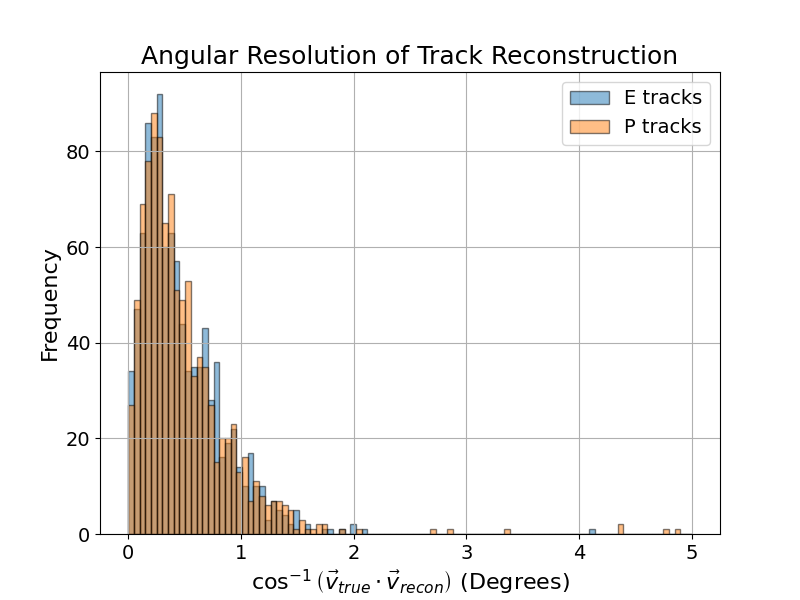

In [26]:
plt.figure(figsize=(8, 6))

plt.hist(np.degrees(np.arccos(dot_products_e)), bins=np.linspace(0,5,100), alpha=0.5, edgecolor='black')
plt.hist(np.degrees(np.arccos(dot_products_p)), bins=np.linspace(0,5,100), alpha=0.5, edgecolor='black')
# plt.yscale('log')
plt.legend(['E tracks', 'P tracks'], fontsize=14)
plt.tick_params(axis='both', labelsize=14)
plt.title('Angular Resolution of Track Reconstruction', fontsize=18)
plt.xlabel('$\\cos^{-1} \\left(\\vec{v}_{true} \\cdot \\vec{v}_{recon}\\right)$ (Degrees)', fontsize=16)
plt.ylabel('Frequency', fontsize=16)
# plt.xlabel('$\\cos^{-1} \\left(\\vec{v}_{true} \\cdot \\vec{v}_{recon}\\right)$ (Degrees)')
# plt.ylabel('Frequency')
# plt.title('Angular Resolution of Track Reconstruction')
plt.grid(True)
plt.show()

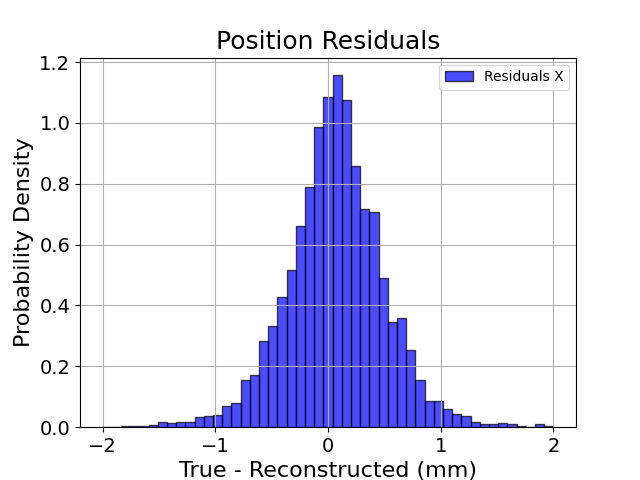

In [40]:
residuals_x = []
residuals_y = []

for event in events:
    for gem in range(4):  # Iterate through all GEMs
        true_pos = getattr(event, f'GEM{gem}_true')  # Get the true position for the GEM
        recon_positions = zip(getattr(event, f'GEM{gem}_clusx'), getattr(event, f'GEM{gem}_clusy'))  # Get the reconstructed positions

        for recon_posx, recon_posy in recon_positions:
            recon_posx = - ( recon_posx[1] * len_per_chan) + half_lengthx
            recon_posy = - ( recon_posy[1] * len_per_chan) + half_lengthy

            residuals_x.append(true_pos[0] - recon_posx)
            residuals_y.append(true_pos[1] - recon_posy)

# Plot the residuals
plt.figure()
plt.hist(residuals_x, bins=np.linspace(-2,2,50), alpha=0.7, label='Residuals X', color='blue', edgecolor='black',  density=True)
# plt.hist(residuals_y, bins=np.linspace(-0.2,0.2,100), alpha=0.7, label='Residuals Y', color='orange', edgecolor='black', density=False)
plt.xlabel('True - Reconstructed (mm)', fontsize=16)
plt.ylabel('Probability Density', fontsize=16)
plt.title('Position Residuals', fontsize=18)
plt.tick_params(axis='both', labelsize=14)

# plt.yscale('log')
plt.legend()
plt.grid(True)
plt.show()

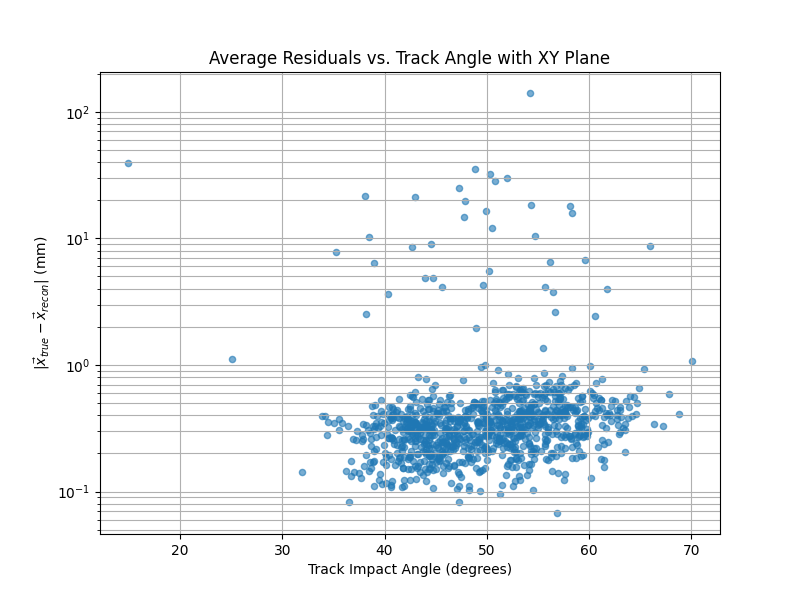

In [28]:
angles = []
avg_residuals = []

for event in events:
    true_vec = event.e_truev0
    # Angle with XY plane (in degrees)
    angle = np.degrees(np.arccos(np.abs(true_vec[2]) / np.linalg.norm(true_vec)))
    angles.append(angle)

    # Compute average residual for this event
    event_residuals = []
    for gem in range(4):
        true_pos = getattr(event, f'GEM{gem}_true')
        clusx = getattr(event, f'GEM{gem}_clusx')
        clusy = getattr(event, f'GEM{gem}_clusy')
        for cx, cy in zip(clusx, clusy):
            recon_x = - (cx[1] * len_per_chan) + half_lengthx
            recon_y = - (cy[1] * len_per_chan) + half_lengthy
            res = np.sqrt((true_pos[0] - recon_x)**2 + (true_pos[1] - recon_y)**2)
            event_residuals.append(res)
    avg_residuals.append(np.mean(event_residuals) if event_residuals else np.nan)

plt.figure(figsize=(8,6))
plt.scatter(angles, avg_residuals, alpha=0.6, s=20)
plt.xlabel('Track Impact Angle (degrees)')
plt.ylabel('$|\\vec{x}_{true} - \\vec{x}_{recon}|$ (mm)')
plt.title('Average Residuals vs. Track Angle with XY Plane')
plt.yscale('log')
plt.grid(which='both')
plt.show()



# Looking at width of cluster and angle

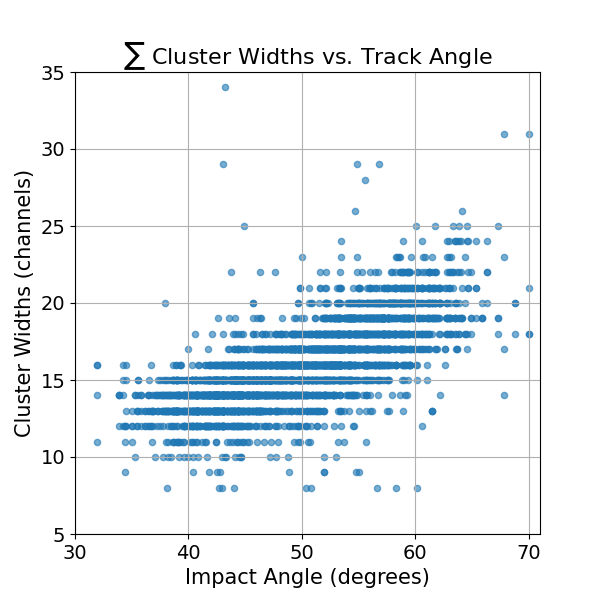

In [29]:
width_sums = []
angles_from_z = []

for event in events:
    # Calculate the angle from the z-axis for the true track
    true_vec = event.e_truev0
    angle_z = np.degrees(np.arccos(np.abs(true_vec[2]) / np.linalg.norm(true_vec)))
    # angles_from_z.append(angle_z)

    # Sum the widths of clusters in x and y for all GEMs
    width_sum = 0
    for gem in range(4):
        clusx = getattr(event, f'GEM{gem}_clusx')
        clusy = getattr(event, f'GEM{gem}_clusy')

        if not clusx or not clusy:
            continue
        width_x = np.abs(clusx[0][2] - clusx[0][0])
        width_y = np.abs(clusy[0][2] - clusy[0][0])

        # width_sums.append(np.sqrt(width_x**2 + width_y**2))
        width_sums.append(width_x)
        angles_from_z.append(angle_z)
    # width_sums.append(width_sum)

plt.figure(figsize=(6,6))
plt.scatter(angles_from_z, width_sums, alpha=0.6, s=20)
plt.tick_params(axis='both', labelsize=14)
plt.title('$\\sum$ Cluster Widths vs. Track Angle', fontsize=16)
plt.xlabel('Impact Angle (degrees)', fontsize=15)
plt.ylabel('Cluster Widths (channels)', fontsize=15)
plt.xlabel('Impact Angle (degrees)')
plt.ylabel('Cluster Widths (channels)')
plt.xlim(30, 71)
plt.ylim(5,35)
# plt.xscale('log')
# plt.yscale('log')
# plt.title('Sum of Cluster Widths vs. Track Angle from Z axis')
plt.grid(True)
plt.show()

# Test the Fitting Stuff

In [30]:
def fit_line_and_intersect_z0(points):
    """
    Fit a line to 4 points in 3D space and find the intersection of the line with the z=0 plane.

    Parameters:
        points (numpy.ndarray): A 4x3 array of points in 3D space.

    Returns:
        tuple: A tuple containing:
            - numpy.ndarray: The intersection point (x, y, z=0) of the fitted line with the z=0 plane.
            - numpy.ndarray: The direction vector of the fitted line.
    """
    if points.shape != (4, 3):
        raise ValueError("Input must be a 4x3 array of points in 3D space.")

    # Calculate the centroid of the points
    centroid = np.mean(points, axis=0)

    # Center the points around the centroid
    centered_points = points - centroid

    # Perform PCA to find the direction of the line
    cov_matrix = np.cov(centered_points.T)
    eigenvalues, eigenvectors = np.linalg.eigh(cov_matrix)
    direction = eigenvectors[:, np.argmax(eigenvalues)]

    # Ensure the direction vector is normalized
    direction /= np.linalg.norm(direction)

    # Calculate the intersection of the line with the z=0 plane
    if np.isclose(direction[2], 0):
        raise ValueError("The fitted line is parallel to the z=0 plane and does not intersect it.")

    t = -centroid[2] / direction[2]
    intersection = centroid + t * direction
    intersection[2] = 0  # Ensure the z-coordinate is exactly 0

    return intersection, direction

In [31]:
from scipy.optimize import leastsq

def fit_line(points):
    """
    Fit a line to a set of points in 3D space using least squares.
    """
    def residuals(params, points):
        x0, y0, z0, dx, dy, dz = params
        line_point = np.array([x0, y0, z0])
        line_dir = np.array([dx, dy, dz])
        line_dir /= np.linalg.norm(line_dir)  # Normalize direction vector
        residuals = []
        for point in points:
            vec = point - line_point
            proj = np.dot(vec, line_dir) * line_dir
            residuals.append(np.linalg.norm(vec - proj))
        return residuals

    # Initial guess for the line parameters
    x0, y0, z0 = np.mean(points, axis=0)
    dx, dy, dz = points[-1] - points[0]
    params0 = [x0, y0, z0, dx, dy, dz]

    # Perform least squares fitting
    result, _ = leastsq(residuals, params0, args=(points,))
    return result

for event in events:
    clusx = getattr(event, f'GEM0_clusx')
    clusy = getattr(event, f'GEM0_clusy')

    bothits = []
    for cx in clusx:
        for cy in clusy:
            ps = []
            ps.append([-(cx[0] * len_per_chan) + half_lengthx, - (cy[0] * len_per_chan) + half_lengthy, 0])
            ps.append([-(cx[2] * len_per_chan) + half_lengthx, - (cy[2] * len_per_chan) + half_lengthy, 0])
            bothits.append(ps)

    clusx = getattr(event, f'GEM1_clusx')
    clusy = getattr(event, f'GEM1_clusy')
    
    tophits = []
    for cx in clusx:
        for cy in clusy:
            ps = []
            ps.append([-(cx[0] * len_per_chan) + half_lengthx, - (cy[0] * len_per_chan) + half_lengthy, 24.9])
            ps.append([-(cx[2] * len_per_chan) + half_lengthx, - (cy[2] * len_per_chan) + half_lengthy, 24.9])
            tophits.append(ps)

    tracks = [t + b for t in tophits for b in bothits]

    event.e_reconx0 = []  # Initialize the list to store starting points
    event.e_reconv0 = []  # Initialize the list to store normalized directional vectors


    for track in tracks:
        track = np.array(track)
        x0, v0 = fit_line_and_intersect_z0(track)
        print(v0)
        event.e_reconx0.append(x0)  # Store the starting point
        event.e_reconv0.append(v0)  # Store the direction vector


[-0.68010514 -0.07499649 -0.72926849]
[-0.78071301 -0.04111295 -0.62353583]
[-0.83626535  0.10793767 -0.53759624]
[-0.81400014 -0.0667646  -0.57701496]
[-0.83486914 -0.05011729 -0.54816218]
[-0.66537742 -0.06505202 -0.74366735]
[-0.86712915 -0.08420216 -0.49091449]
[-0.8133723   0.01696019 -0.58149623]
[-0.70923625 -0.04011148 -0.70382882]
[-0.75115413  0.01511223 -0.65995386]
[-0.72822463  0.01968207 -0.68505584]
[-0.72734985 -0.00603258 -0.68624034]
[-0.74121432  0.0082242  -0.67121807]
[-0.8177494  -0.04023255 -0.57416657]
[-0.82016518  0.05002768 -0.56993535]
[-0.86359639  0.05965272 -0.50064242]
[-0.65808651 -0.08400745 -0.7482412 ]
[-0.70543412  0.03250968 -0.70802953]
[-0.73736673 -0.03354743 -0.67465908]
[-0.68982621  0.33060271 -0.64408202]
[-0.85078486 -0.01632265 -0.52526059]
[-0.7334732   0.0040271  -0.67970644]
[-0.8456351   0.06889394 -0.52929661]
[-0.79059498  0.08986061 -0.60571003]
[-0.78199783  0.17282399 -0.59884161]
[-0.68349045  0.07912153 -0.72565873]
[-0.67202056

[0.99993906 0.99974131 0.99991496 ... 0.99977915 0.9997871  0.99988433]


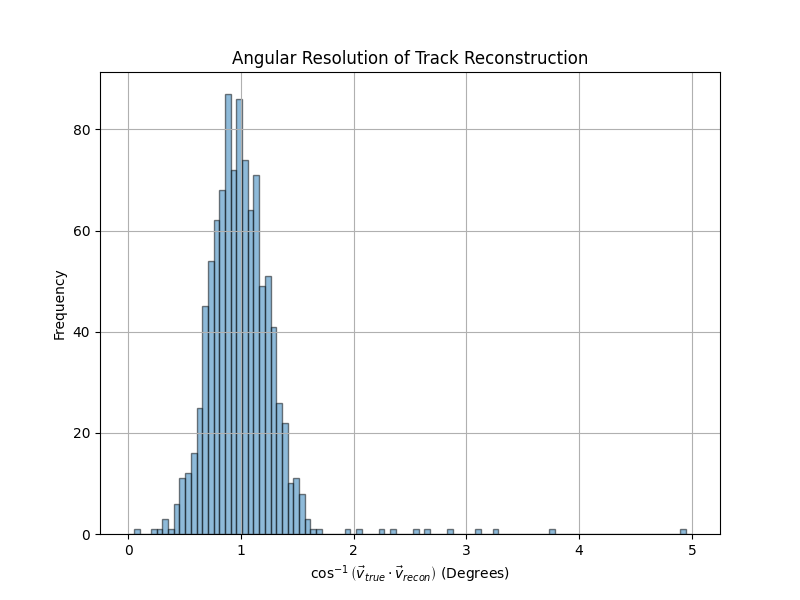

In [32]:
dot_products_e = []
dot_products_p = []

for event in events:
    true_vector = event.e_truev0  # Actual track vector

    reconstructed_vectors = event.e_reconv0  # Reconstructed directional vectors

    
    for recon_vector in reconstructed_vectors:
        dpe = np.dot(true_vector, -recon_vector)
        dot_products_e.append(dpe)

dot_products_e = np.array(dot_products_e)
dot_products_p = np.array(dot_products_p)

print(dot_products_e)


plt.figure(figsize=(8, 6))

plt.hist(np.degrees(np.arccos(dot_products_e)), bins=np.linspace(0,5,100), alpha=0.5, edgecolor='black')
# plt.hist(np.degrees(np.arccos(dot_products_p)), bins=np.linspace(0,5,100), alpha=0.5, edgecolor='black')
# plt.yscale('log')
plt.xlabel('$\\cos^{-1} \\left(\\vec{v}_{true} \\cdot \\vec{v}_{recon}\\right)$ (Degrees)')
plt.ylabel('Frequency')
plt.title('Angular Resolution of Track Reconstruction')
plt.grid(True)
plt.show()

# Test out tracking method

In [12]:
class hit:
    def __init__(self, x, y, dx, dy):
        self.x = x
        self.y = y
        self.vec2 = np.array([dx, dy])

        

In [13]:
event = events[123]

print(event.ID)
etopxs = event.GEM0_clusx
etopys = event.GEM0_clusy

ebotxs = event.GEM1_clusx
ebotys = event.GEM1_clusy
# print(etopys)

tophits = []
bothits = []

print('tops')
for xs in etopxs:
    # print(xs)
    for ys in etopys:
        # print(ys)
        tophits.append(hit(xs[1], ys[1], -(xs[2]-xs[0] -4), ys[2]-ys[0]-4))
        tophits.append(hit(xs[1], ys[1], -(xs[2]-xs[0] -4), -(ys[2]-ys[0]-4) ))

        print(tophits[-1].vec2, )

print('bots')
for xs in ebotxs:
    for ys in ebotys:
        bothits.append(hit(xs[1], ys[1], -(xs[2]-xs[0] -4), ys[2]-ys[0]-4))
        bothits.append(hit(xs[1], ys[1], -(xs[2]-xs[0] -4), -(ys[2]-ys[0]-4) ))
        print(bothits[-1].vec2, )

matrixtop = np.array([i.vec2/ np.sqrt((i.vec2**2).sum()) for i in tophits])
matrixbot = np.array([i.vec2/ np.sqrt((i.vec2**2).sum()) for i in bothits])

print(matrixtop)
print(np.transpose(matrixbot) )
print()
dots = matrixtop @ np.transpose(matrixbot) 
print()
print(dots)            


123
tops
[-10  -5]
bots
[-11  -6]
[[-0.89442719  0.4472136 ]
 [-0.89442719 -0.4472136 ]]
[[-0.87789557 -0.87789557]
 [ 0.47885213 -0.47885213]]


[[0.99936285 0.57106449]
 [0.57106449 0.99936285]]


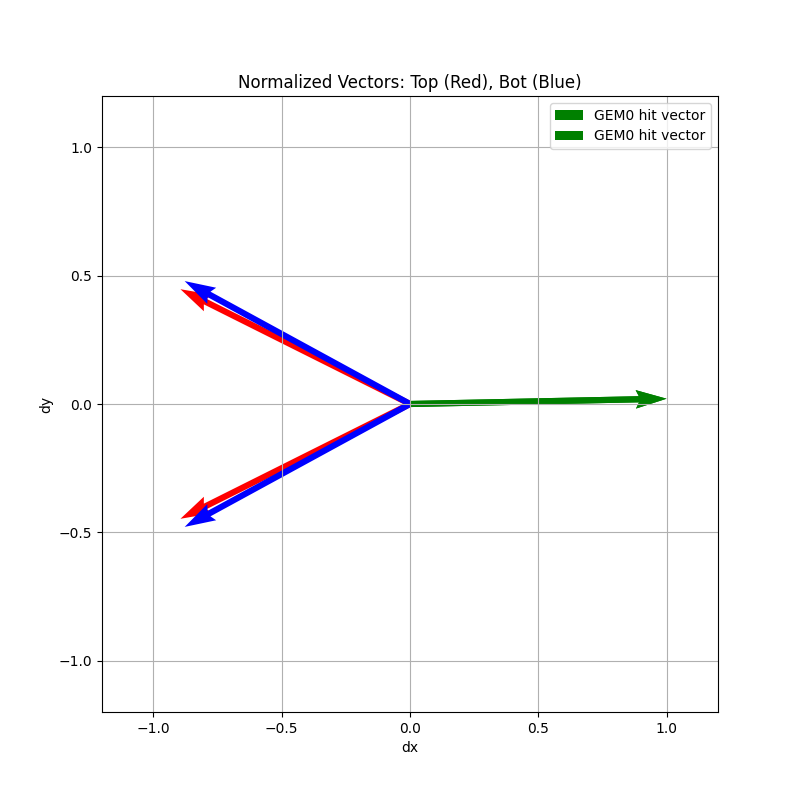

In [14]:
plt.figure(figsize=(8, 8))
origin = np.array([0, 0])

# Plot top vectors in red
for vec in matrixtop:
    plt.quiver(*origin, *vec, angles='xy', scale_units='xy', scale=1, color='red', width=0.01)

# Plot bot vectors in blue
for vec in matrixbot:
    plt.quiver(*origin, *vec, angles='xy', scale_units='xy', scale=1, color='blue', width=0.01)

    # Plot actual hit vectors from GEM0_hitsx and GEM0_hitsy in green
    hitsx = event.GEM0_hitsx
    hitsy = event.GEM0_hitsy
    if len(hitsx) > 1 and len(hitsy) > 1:
        dx = hitsx[-1] - hitsx[0]
        dy = hitsy[-1] - hitsy[0]
        norm = np.sqrt(dx**2 + dy**2)
        if norm > 0:
            plt.quiver(*origin, dx/norm, dy/norm, angles='xy', scale_units='xy', scale=1, color='green', width=0.01, label='GEM0 hit vector')
            plt.legend()

plt.xlim(-1.2, 1.2)
plt.ylim(-1.2, 1.2)
plt.xlabel('dx')
plt.ylabel('dy')
plt.title('Normalized Vectors: Top (Red), Bot (Blue)')
plt.grid(True)
plt.gca().set_aspect('equal')
plt.show()